# Cardiotocogram Dataset
## Ignacio Vellido Expósito
### https://archive.ics.uci.edu/ml/datasets/cardiotocography
```
Data Set Information:
    2126 fetal cardiotocograms (CTGs) were automatically processed and the respective 
    diagnostic features measured. The CTGs were also classified by three expert 
    obstetricians and a consensus classification label assigned to each of them. 
    Classification was both with respect to a morphologic pattern (A, B, C. ...) 
    and to a fetal state (N, S, P). Therefore the dataset can be used either for 
    10-class or 3-class experiments.

Exam data		
    FileName	of CTG examination		
    Date	of the examination		
    b	start instant		
    e	end instant		
Measurements		
    LBE	baseline value (medical expert)		
    LB	baseline value (SisPorto)		
    AC	accelerations (SisPorto)		
    FM	foetal movement (SisPorto)		
    UC	uterine contractions (SisPorto)		
    ASTV	percentage of time with abnormal short term variability  (SisPorto)		
    mSTV	mean value of short term variability  (SisPorto)		
    ALTV	percentage of time with abnormal long term variability  (SisPorto)		
    mLTV	mean value of long term variability  (SisPorto)		
    DL	light decelerations		
    DS	severe decelerations		
    DP	prolongued decelerations		
    DR	repetitive decelerations		
    Width	histogram width		
    Min	low freq. of the histogram		
    Max	high freq. of the histogram		
    Nmax	number of histogram peaks		
    Nzeros	number of histogram zeros		
    Mode	histogram mode		
    Mean	histogram mean		
    Median	histogram median		
    Variance	histogram variance		
    Tendency	histogram tendency: -1=left assymetric; 0=symmetric; 1=right assymetric		
Classification		
    A	calm sleep		
    B	REM sleep		
    C	calm vigilance		
    D	active vigilance		
    SH	shift pattern (A or Susp with shifts)		
    AD	accelerative/decelerative pattern (stress situation)		
    DE	decelerative pattern (vagal stimulation)		
    LD	largely decelerative pattern		
    FS	flat-sinusoidal pattern (pathological state)		
    SUSP	suspect pattern		
    CLASS	Class code (1 to 10) for classes A to SUSP		
    NSP	Normal=1; Suspect=2; Pathologic=3		
```

Vamos a clasificar respecto a la última variable (NSP), el resto de columnas de 
clasificación las quitaremos.

También eliminaremos la columnas con información del exámen médico por no ser
medidas usadas para etiquetar los datos.

Nos quedará por tanto un problema de clasificación multivariable con tres posibles
etiquetas.

In [1]:
################################################################################
# Librerías
################################################################################

import random

import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

# Preprocesamiento
from sklearn.preprocessing import Normalizer
from sklearn.model_selection import train_test_split
from sklearn.decomposition import PCA
from sklearn.neighbors import KNeighborsClassifier

# Algoritmos
from sklearn.svm import SVC

from sklearn.model_selection import GridSearchCV
from sklearn.model_selection import KFold
from sklearn.ensemble import RandomForestClassifier

# Evaluación
from sklearn.metrics import classification_report, \
                            confusion_matrix, \
                            plot_confusion_matrix

In [2]:
################################################################################
# Lectura
################################################################################

# Semilla con la que se han analizado los resultados
random.seed(9999)

# Cargamos los datos (sheet Raw Data nos es más cómodo que Data)
data = pd.read_excel("data/CTG.xls", "Raw Data")

# Eliminamos las 3 últimas filas que solo contienen valores de máximos y mínimos
data = data[:-3]

# Eliminamos la primera fila que está vacía
data = data[1:]

# Eliminamos las columnas que no contienen información relevante para la 
# clasificación
removed_columns = ["FileName", "Date", "SegFile", "b", "e", "A", "B", "C", "D",
                    "AD", "DE", "LD", "FS", "SUSP", "CLASS"]
data = data.drop(columns=removed_columns)

print("Datos sin normalizar:")
print(data)

# Separamos las etiquetas
labels = data.pop("NSP")
labels = pd.Categorical(labels)
labels = labels.rename_categories(["N", "S", "P"])
labels_names = ["Normal", "Suspect", "Pathologic"]

# Normalizamos los datos (estandarización)
data_norm = Normalizer().fit(data).transform(data)
data_norm = pd.DataFrame(data_norm)

print("------------------------------------------------------------------")
print("Datos normalizados:")
print(data)

# Nos quedan 24 clasificadores con 2126 instancias

Datos sin normalizar:
        LBE     LB   AC   FM   UC  ASTV  MSTV  ALTV  MLTV   DL  ...    Max  \
1     120.0  120.0  0.0  0.0  0.0  73.0   0.5  43.0   2.4  0.0  ...  126.0   
2     132.0  132.0  4.0  0.0  4.0  17.0   2.1   0.0  10.4  2.0  ...  198.0   
3     133.0  133.0  2.0  0.0  5.0  16.0   2.1   0.0  13.4  2.0  ...  198.0   
4     134.0  134.0  2.0  0.0  6.0  16.0   2.4   0.0  23.0  2.0  ...  170.0   
5     132.0  132.0  4.0  0.0  5.0  16.0   2.4   0.0  19.9  0.0  ...  170.0   
...     ...    ...  ...  ...  ...   ...   ...   ...   ...  ...  ...    ...   
2122  140.0  140.0  0.0  0.0  6.0  79.0   0.2  25.0   7.2  0.0  ...  177.0   
2123  140.0  140.0  1.0  0.0  9.0  78.0   0.4  22.0   7.1  0.0  ...  169.0   
2124  140.0  140.0  1.0  0.0  7.0  79.0   0.4  20.0   6.1  0.0  ...  170.0   
2125  140.0  140.0  1.0  0.0  9.0  78.0   0.4  27.0   7.0  0.0  ...  169.0   
2126  142.0  142.0  1.0  1.0  5.0  74.0   0.4  36.0   5.0  0.0  ...  159.0   

      Nmax  Nzeros   Mode   Mean  Median 

In [3]:
# Aunque tenemos demasiadas características, podemos ver algunos datos estadísticos
print(data.describe())

# Tenemos un problema desbalanceado, muchas etiquetas de valor N
print(labels.describe())

               LBE           LB           AC           FM           UC  \
count  2126.000000  2126.000000  2126.000000  2126.000000  2126.000000   
mean    133.303857   133.303857     2.722484     7.241298     3.659925   
std       9.840844     9.840844     3.560850    37.125309     2.847094   
min     106.000000   106.000000     0.000000     0.000000     0.000000   
25%     126.000000   126.000000     0.000000     0.000000     1.000000   
50%     133.000000   133.000000     1.000000     0.000000     3.000000   
75%     140.000000   140.000000     4.000000     2.000000     5.000000   
max     160.000000   160.000000    26.000000   564.000000    23.000000   

              ASTV         MSTV        ALTV         MLTV           DL  ...  \
count  2126.000000  2126.000000  2126.00000  2126.000000  2126.000000  ...   
mean     46.990122     1.332785     9.84666     8.187629     1.570085  ...   
std      17.192814     0.883241    18.39688     5.628247     2.499229  ...   
min      12.000000   

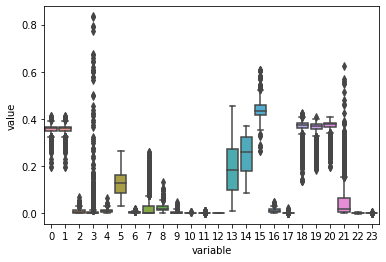

In [4]:
################################################################################
# Visualizaciones
################################################################################

# ------------------------------------------------------------------------------
# Boxplots (usamos los datos normalizados para que estén en el mismo rango)
sns.boxplot(x="variable", y="value", data=pd.melt(data_norm))
plt.show()

# Se aprecian distribuciones bastante diferentes en las variables

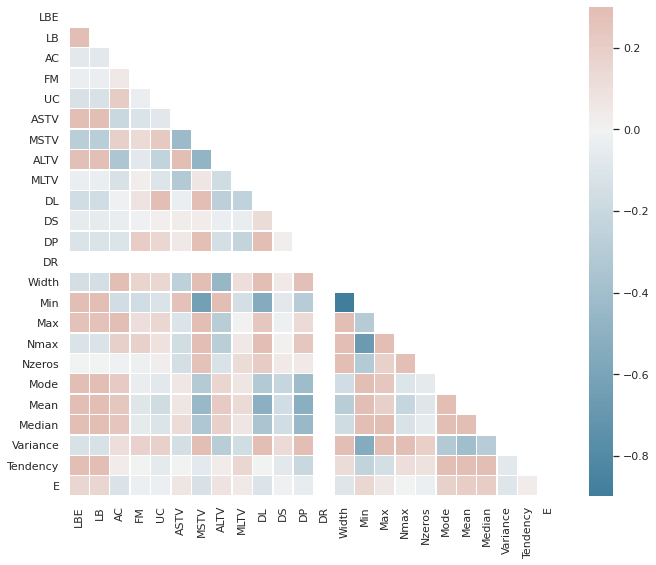

In [5]:
# ------------------------------------------------------------------------------
# Correlación (https://seaborn.pydata.org/examples/many_pairwise_correlations.html)
sns.set_theme(style="white")

corr = data.corr()

# Generate a mask for the upper triangle
mask = np.triu(np.ones_like(corr, dtype=bool))

# Set up the matplotlib figure
f, ax = plt.subplots(figsize=(11, 9))

# Generate a custom diverging colormap
cmap = sns.diverging_palette(230, 20, as_cmap=True)

# Draw the heatmap with the mask and correct aspect ratio
sns.heatmap(corr, mask=mask, cmap=cmap, vmax=.3, center=0,
            square=True, linewidths=.5)
plt.show()

# Hay algunas variables correladass negativamente, pero con correlación fuerte pocas

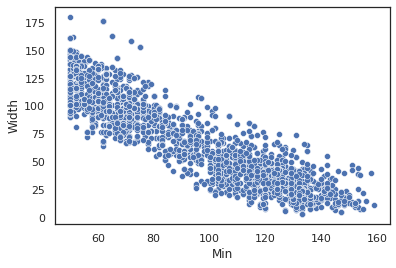

In [6]:
# ------------------------------------------------------------------------------
# Scatterplot

# De 2 variables correladas (puesto que esta es alta, sería recomendable quitar una)
sns.scatterplot(data=data, x="Min", y="Width")
plt.show()

In [7]:
################################################################################
# Preprocesamiento
################################################################################

# Como tenemos bastantes datos, separamos un 20% para test
# Necesitamos que los datos estén normalizados antes de aplicar PCA
x_train, x_test, y_train, y_test = train_test_split(data_norm, labels, test_size=0.2)


# Calculamos PCA sobre train
n_components = 5    # Bajo porque los tres modelos que tenemos tienden a 
                    # sobreajustar
pca = PCA(n_components=n_components, svd_solver="randomized", 
            whiten=True).fit(x_train) # No queremos que las componentes devueltas
                                      # estén correladas

# Aplicamos PCA
x_train_pca = pca.transform(x_train)
x_test_pca = pca.transform(x_test)

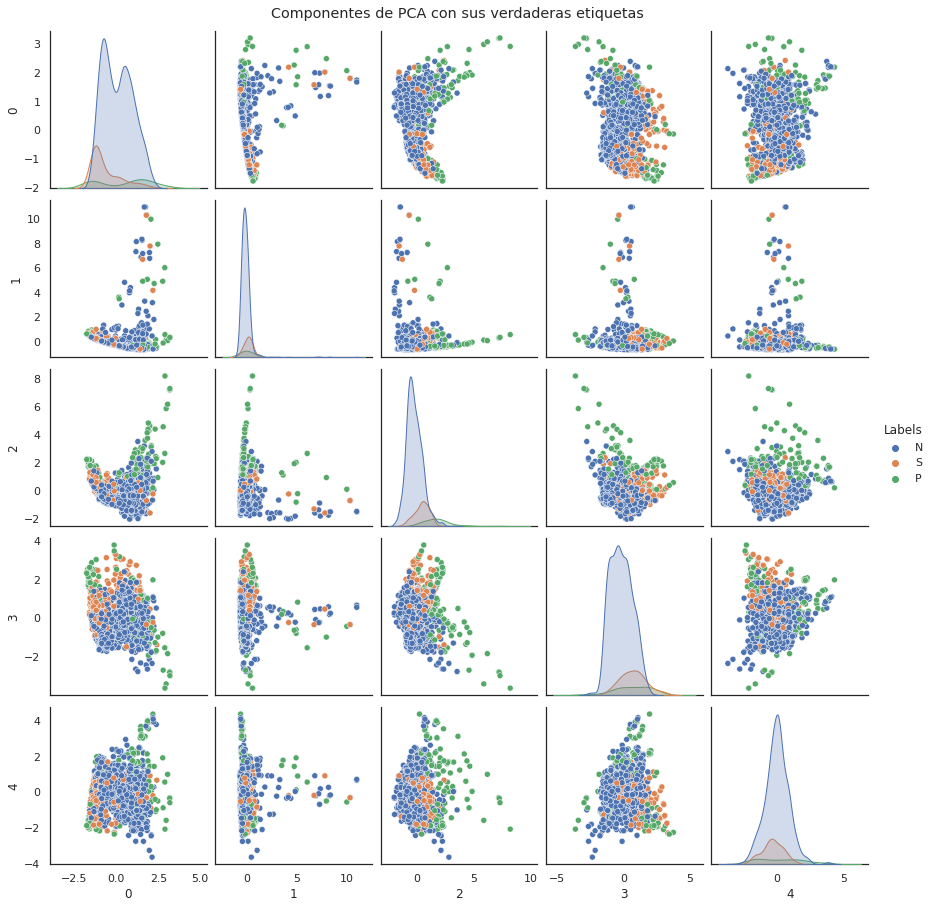

In [8]:
# ------------------------------------------------------------------------------
# Mostramos algunos gráficos de las componentes

df = pd.DataFrame(x_train_pca)
df["Labels"] = y_train

sns.pairplot(df, hue="Labels").fig.suptitle("Componentes de PCA con sus verdaderas etiquetas", y=1.01)
plt.show()


In [9]:
################################################################################
# Clasificando con SVM
################################################################################
print("------------------------------------------------------------------")
print("Clasificando con SVM")
print("------------------------------------------------------------------")

# Declaración de hiperparámetros
param_grid = {
    "C": [10, 1e3, 1e5],        # Valores de regularización
    "gamma": [0.01, 0.001],     # Grado de influencia de un valor
    "kernel": ["rbf", "poly"]   # Kernel rbf o polinomial
}

# Test de hiperparámetros con cross-validation de 5 folds
clf = GridSearchCV(SVC(class_weight="balanced"),
                    param_grid)
clf = clf.fit(x_train_pca, y_train)

print("Mejores hiperparámetros del modelo:")
print(clf.best_params_)
print("\nMejor score obtenido:")
print(clf.best_score_)
# Se nos queda un modelo con alto grado de regularización y kernel polinomial

# Guardamos el mejor estimador
best_svm = clf.best_estimator_

#############################
# Evaluación final del modelo
#############################

# Predecimos sobre los datos de test que habíamos reservado
y_pred = clf.predict(x_test_pca)

print("\nResultados de la predicción sobre test:")
print(classification_report(y_test, y_pred, target_names=labels_names))
print("Matriz de confusión:")
print(confusion_matrix(y_test, y_pred))




------------------------------------------------------------------
Clasificando con SVM
------------------------------------------------------------------
Mejores hiperparámetros del modelo:
{'C': 100000.0, 'gamma': 0.001, 'kernel': 'poly'}

Mejor score obtenido:
0.8541176470588235

Resultados de la predicción sobre test:
              precision    recall  f1-score   support

      Normal       0.86      0.94      0.90       325
     Suspect       0.78      0.74      0.76        47
  Pathologic       0.38      0.19      0.25        54

    accuracy                           0.83       426
   macro avg       0.68      0.62      0.64       426
weighted avg       0.79      0.83      0.80       426

Matriz de confusión:
[[307   7  11]
 [  7  35   5]
 [ 41   3  10]]


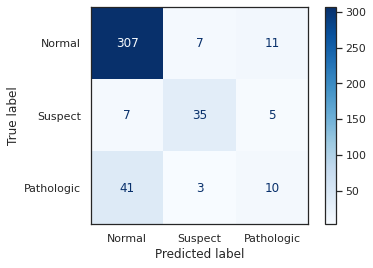

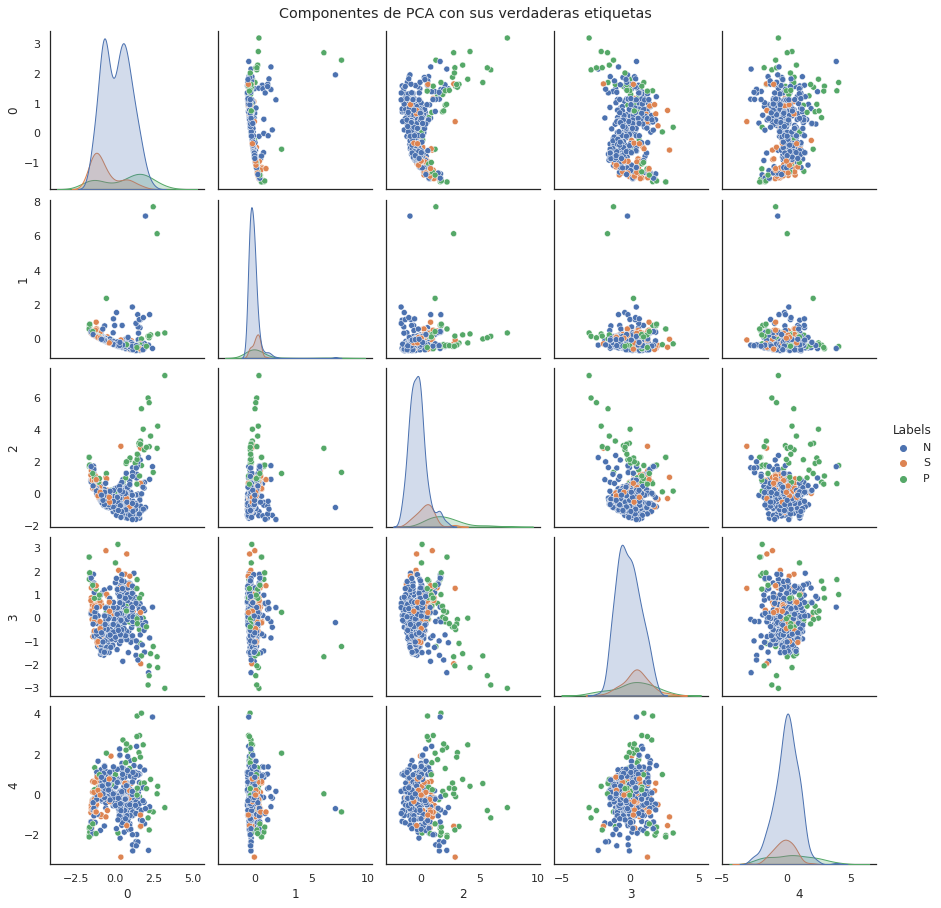

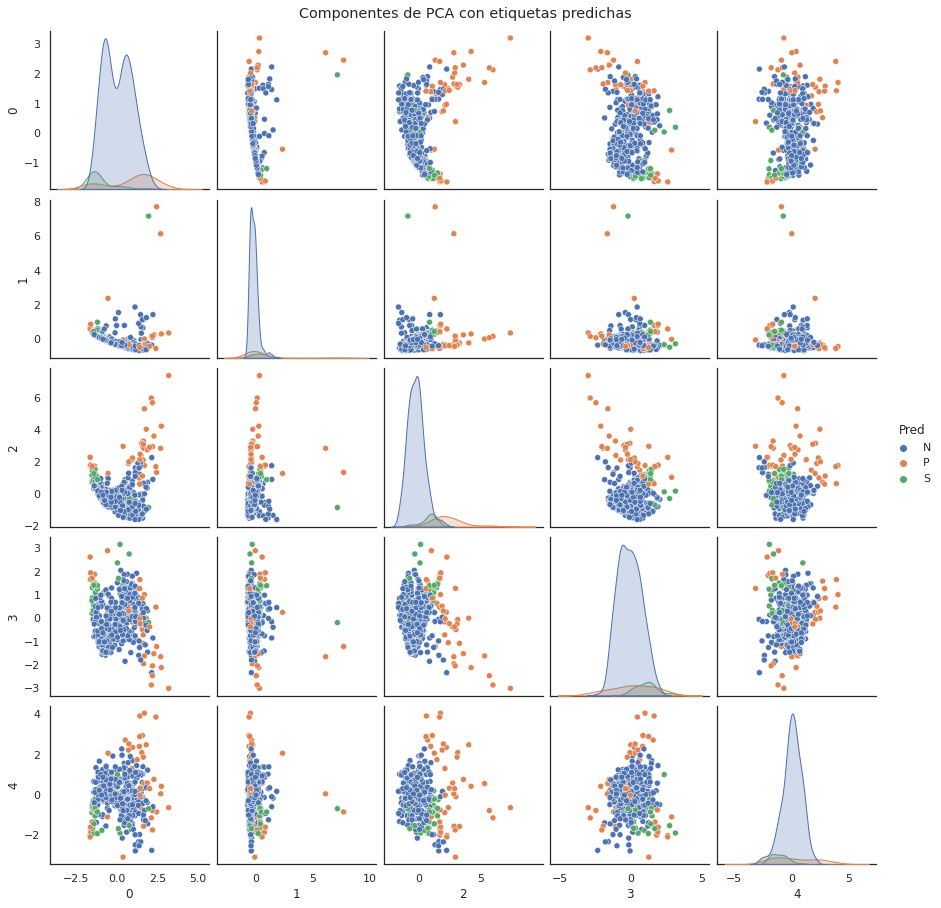

In [10]:
# ------------------------------------------------------------------------------
# Mostramos gráficos sobre los resultados
disp = plot_confusion_matrix(best_svm, x_test_pca, y_test,
                             display_labels=labels_names, cmap=plt.cm.Blues)
plt.show()

# Clasificación realizada en test
df = pd.DataFrame(x_test_pca)
df["Labels"] = y_test
df["Pred"] = y_pred

sns.pairplot(df, hue="Labels").fig.suptitle("Componentes de PCA con sus verdaderas etiquetas", y=1.01)
plt.show()

sns.pairplot(df, hue="Pred").fig.suptitle("Componentes de PCA con etiquetas predichas", y=1.01)
plt.show()

# Tenemos buenos resultados, pero no es una gran mejora respecto respecto de una
# predicción sin aprendizaje (si siempre dijéramos N acertaríamos un 77% de las veces)

In [11]:
################################################################################
# Clasificando con KNN
################################################################################
print("------------------------------------------------------------------")
print("Clasificando con KNN")
print("------------------------------------------------------------------")

# Declaración de hiperparámetros
param_grid = {
    "n_neighbors" : [3, 5, 7, 11, 13, 15],  # Número de vecinos
    "weights": ["uniform", "distance"]      # Selección ponderada por distancia o no
}

# Test de hiperparámetros
clf = GridSearchCV(KNeighborsClassifier(), param_grid)
clf = clf.fit(x_train_pca, y_train)

print("Mejores hiperparámetros del modelo:")
print(clf.best_params_)
print("\nMejor score obtenido:")
print(clf.best_score_)
# Se consiguen mejores resultados con un KNN de tamaño intermedio/bajo con 
# influencia ponderada por la distancia

# Guardamos el mejor estimador
best_knn = clf.best_estimator_

#############################
# Evaluación final del modelo
#############################

# Predecimos sobre los datos de test que habíamos reservado
y_pred = clf.predict(x_test_pca)

print("\nResultados de la predicción sobre test:")
print(classification_report(y_test, y_pred, target_names=labels_names))
print("Matriz de confusión:")
print(confusion_matrix(y_test, y_pred))

------------------------------------------------------------------
Clasificando con KNN
------------------------------------------------------------------
Mejores hiperparámetros del modelo:
{'n_neighbors': 5, 'weights': 'distance'}

Mejor score obtenido:
0.8788235294117648

Resultados de la predicción sobre test:
              precision    recall  f1-score   support

      Normal       0.91      0.95      0.93       325
     Suspect       0.88      0.81      0.84        47
  Pathologic       0.64      0.52      0.57        54

    accuracy                           0.88       426
   macro avg       0.81      0.76      0.78       426
weighted avg       0.87      0.88      0.88       426

Matriz de confusión:
[[309   3  13]
 [  6  38   3]
 [ 24   2  28]]


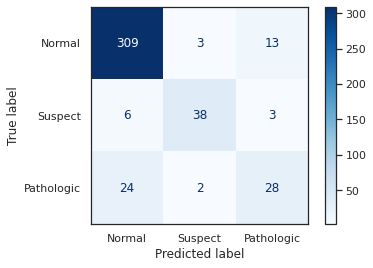

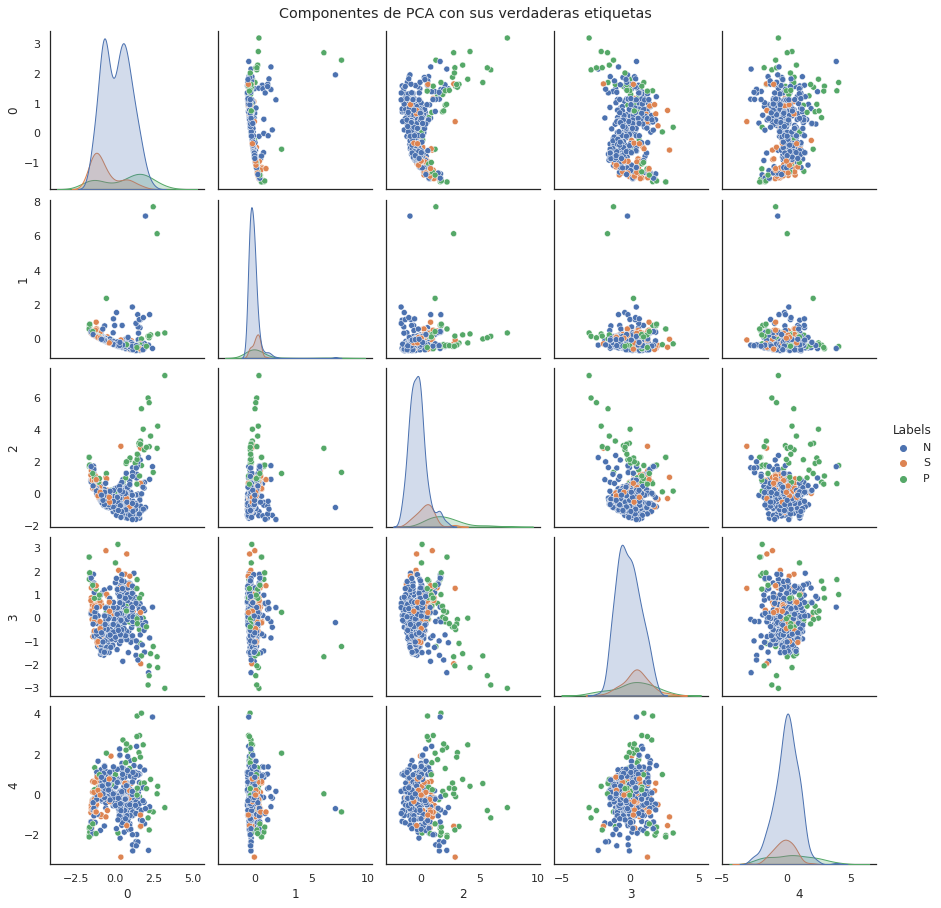

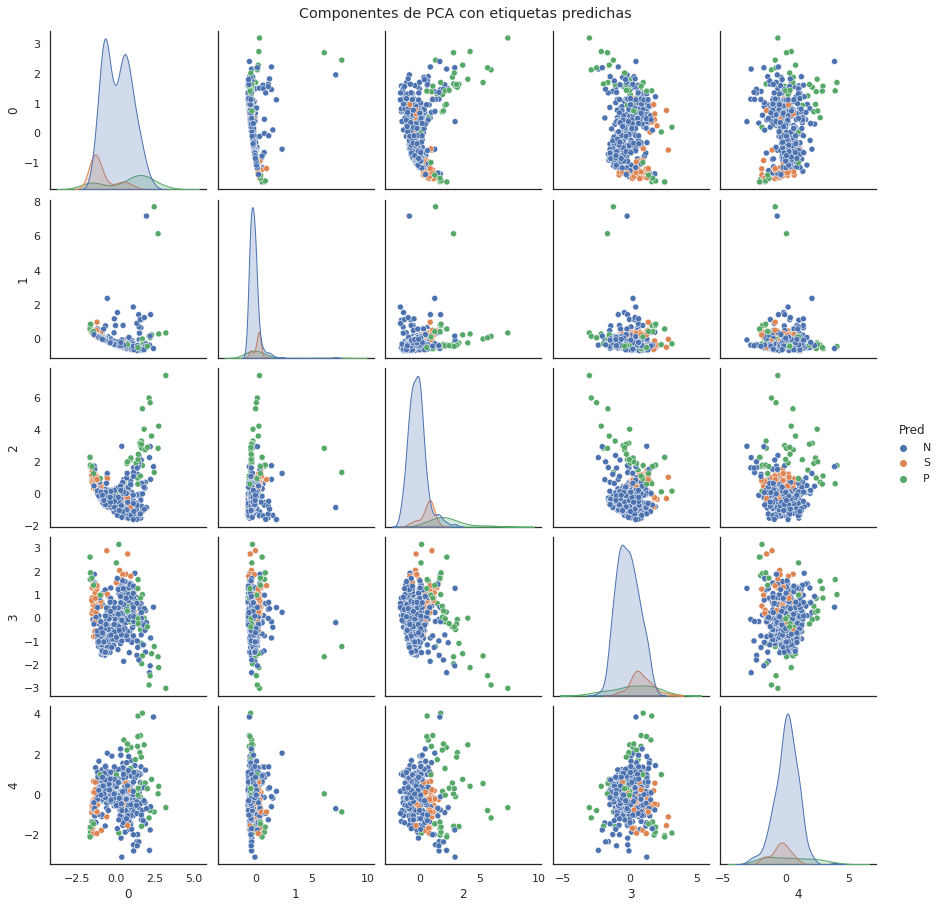

In [12]:
# ------------------------------------------------------------------------------
# Mostramos gráficos sobre los resultados
disp = plot_confusion_matrix(best_knn, x_test_pca, y_test,
                                display_labels=labels_names, cmap=plt.cm.Blues)
plt.show()


df["Pred"] = y_pred

sns.pairplot(df, hue="Labels").fig.suptitle("Componentes de PCA con sus verdaderas etiquetas", y=1.01)
plt.show()

sns.pairplot(df, hue="Pred").fig.suptitle("Componentes de PCA con etiquetas predichas", y=1.01)
plt.show()

# Resultados un poco mejores que con SVM, probablemente porque tal y como se ve
# en las gráficas las clases no son fácilmente separables

In [13]:
################################################################################
# Clasificando con Random Forest
################################################################################
print("------------------------------------------------------------------")
print("Clasificando con Random Forest")
print("------------------------------------------------------------------")

# Declaración de hiperparámetros
param_grid = {
    "n_estimators" : [10, 50, 100, 200, 500],    # Nº de árboles
    "max_depth" : [None, 20]    # Permitir crecer a los árboles o hacer poda
}

# Test de hiperparámetros
clf = GridSearchCV(RandomForestClassifier(), param_grid)
clf = clf.fit(x_train_pca, y_train)

print("Mejores hiperparámetros del modelo:")
print(clf.best_params_)
print("\nMejor score obtenido:")
print(clf.best_score_)
# Los mejores hiperparámetros corresponden a un bosque con muchos árboles pero
# con poda a priori

# Guardamos el mejor estimador
best_rf = clf.best_estimator_

#############################
# Evaluación final del modelo
#############################

# Predecimos sobre los datos de test que habíamos reservado
y_pred = clf.predict(x_test_pca)

print("\nResultados de la predicción sobre test:")
print(classification_report(y_test, y_pred, target_names=labels_names))
print("Matriz de confusión:")
print(confusion_matrix(y_test, y_pred))

------------------------------------------------------------------
Clasificando con Random Forest
------------------------------------------------------------------
Mejores hiperparámetros del modelo:
{'max_depth': 20, 'n_estimators': 100}

Mejor score obtenido:
0.8752941176470589

Resultados de la predicción sobre test:
              precision    recall  f1-score   support

      Normal       0.91      0.94      0.93       325
     Suspect       0.87      0.83      0.85        47
  Pathologic       0.62      0.52      0.57        54

    accuracy                           0.88       426
   macro avg       0.80      0.76      0.78       426
weighted avg       0.87      0.88      0.87       426

Matriz de confusión:
[[307   6  12]
 [  3  39   5]
 [ 26   0  28]]


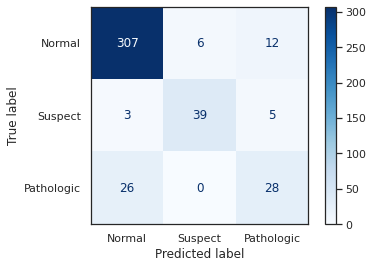

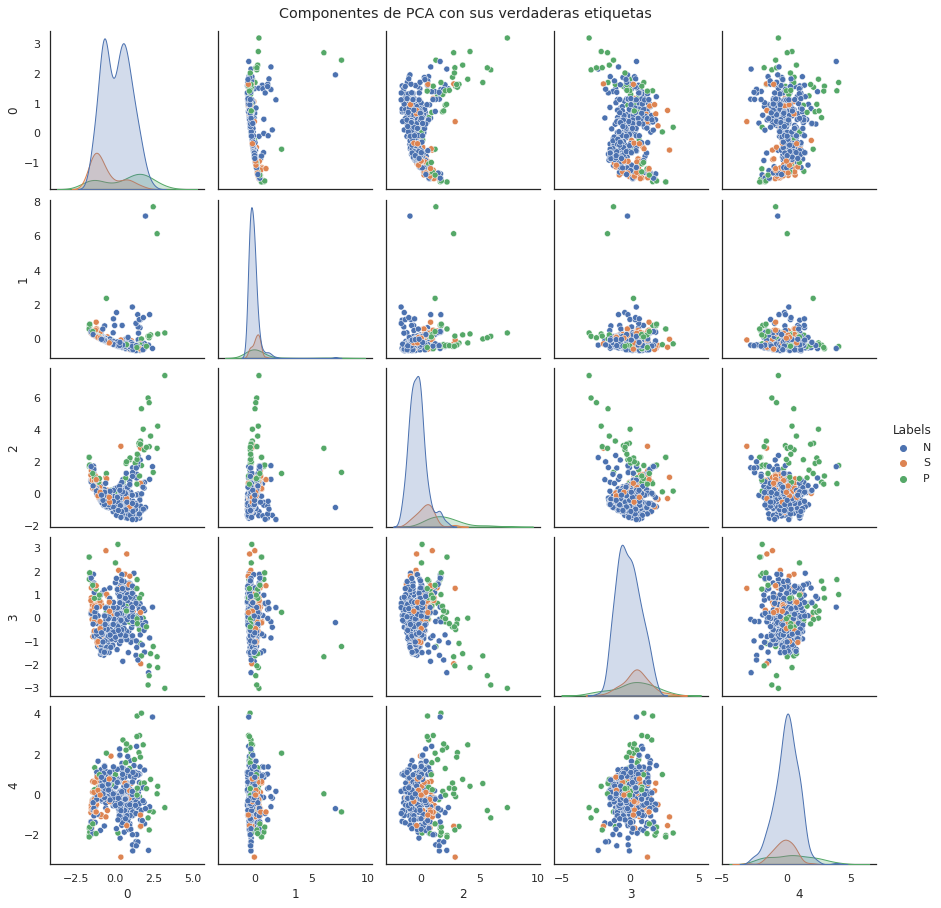

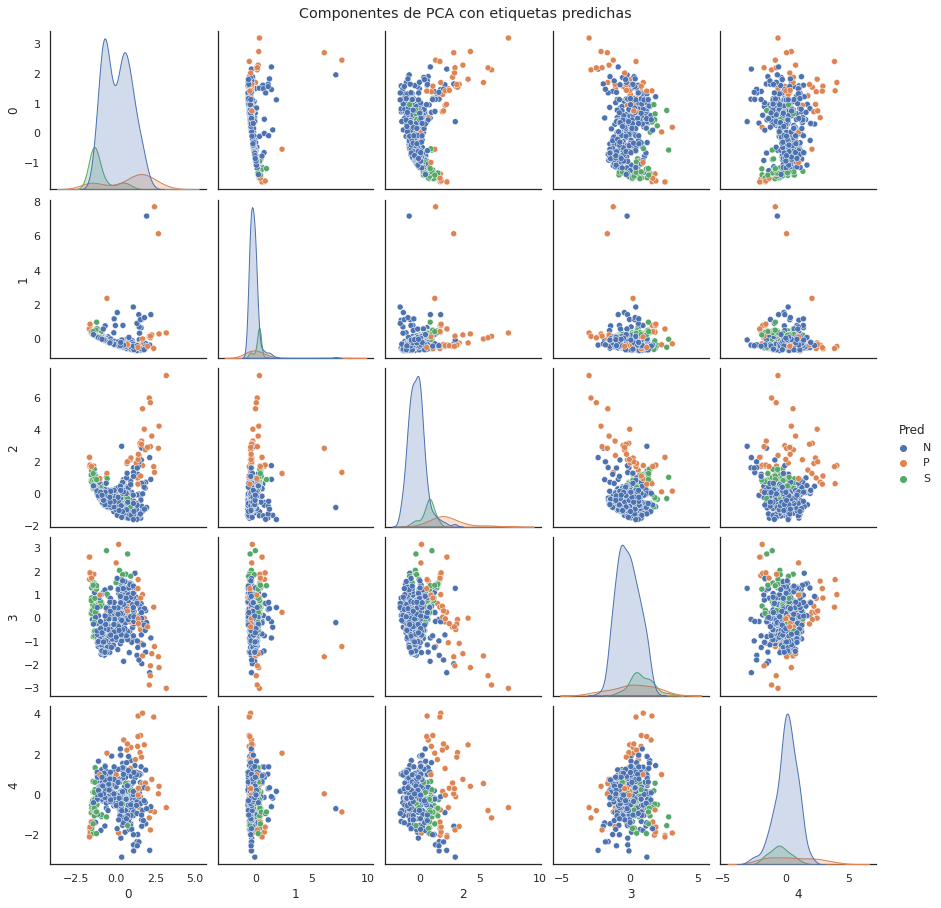

In [14]:
# ------------------------------------------------------------------------------
# Mostramos gráficos sobre los resultados
disp = plot_confusion_matrix(best_rf, x_test_pca, y_test,
                                display_labels=labels_names, cmap=plt.cm.Blues)
plt.show()

df["Pred"] = y_pred

sns.pairplot(df, hue="Labels").fig.suptitle("Componentes de PCA con sus verdaderas etiquetas", y=1.01)
plt.show()

sns.pairplot(df, hue="Pred").fig.suptitle("Componentes de PCA con etiquetas predichas", y=1.01)
plt.show()

# Random Forest tiene más facilidad de overfitting, pero limitando el tamaño de
# los árboles evitamos que se sobreajuste demasiado. Obtenemos una accuracy 3%
# mejor que SVM e igual que KNN

In [15]:
# Los datos esta procesados con PCA y no son interpretables
# Pero podemos ver la forma que tiene alguno de los árboles del modelo

# Función obtenida de: 
# https://towardsdatascience.com/how-to-visualize-a-decision-tree-from-a-random-forest-in-python-using-scikit-learn-38ad2d75f21c

from sklearn.tree import export_graphviz

# Export as dot file
export_graphviz(best_rf.estimators_[1], out_file="tree.dot", 
                class_names = labels_names,
                rounded = True, proportion = False, 
                precision = 2, filled = True)

# Convert to png using system command (requires Graphviz)
from subprocess import call
call(['dot', '-Tpng', 'tree.dot', '-o', 'tree.png', '-Gdpi=600'])

# Display in jupyter notebook
from IPython.display import Image
Image(filename = 'tree.png')

# Como el mejor modelo no tiene límite de profundidad, vemos
# que el árbol es bastante grande